In [1]:
%matplotlib inline

import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import xarray as xr
import cmocean.cm as cmocean
import glob
import matplotlib.path as mpath
import matplotlib.colors as col
from netCDF4 import Dataset
import gsw


import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client

figdir = '/g/data/e14/pc5520/figures/basal_melt_param/'

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 4
Total threads: 16,Total memory: 180.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34433,Workers: 4
Dashboard: /proxy/8787/status,Total threads: 16
Started: Just now,Total memory: 180.00 GiB
Comm: tcp://127.0.0.1:35921,Total threads: 4
Dashboard: /proxy/37267/status,Memory: 45.00 GiB
Nanny: tcp://127.0.0.1:35791,


List of obs and model units. 

| Oservations/Model | Temperature units | Salinity units |
| --- | --- | --- |
| Pauthenet et al. (2021) | in situ temperature [C] | Practical salinity [psu] |
| Schmidtko et a. (2014) | Conservative temperature [C] | Absolute salinity [g/kg] |
| --- | --- | --- |
| ACCESS-OM2-01 |  Conservative temperature [K] | Practical salinity [psu]  |


Read in perturbation and control model data. 

In [3]:
# database for control simulation:
session_name = '/g/data/v45/wf4500/databases/gdata_01deg_jra55v13_ryf9091_DSW.db'
master_session = cc.database.create_session(session_name)
control = '01deg_jra55v13_ryf9091_DSW'

# database for  basal melt experiments:
session_name = '/g/data/ik11/databases/basal_melt_MOM5.db'
basal_melt_session = cc.database.create_session(session_name)
basal_gade = '01deg_jra55v13_ryf9091_DSW_BasalGade_NoIcb'#'accessom2-GPC023'
icb_gade = '01deg_jra55v13_ryf9091_DSW_BasalGade_YesIcb'#'accessom2-GPC026'
basal_nogade = '01deg_jra55v13_ryf9091_DSW_BasalNoGade_NoIcb'

fontsize=15
lat_slice  = slice(-81,-59)
start_time='1909-01-01'
end_time='1910-01-01'

In [21]:
def read_data(start_time, end_time, expt, session):
    lat_slice  = slice(-80,-59)
    time_slice = slice(start_time, end_time)
    
    temp = cc.querying.getvar(expt,'temp',session,frequency='1 monthly',start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice) - 273.15
    salt = cc.querying.getvar(expt,'salt',session,frequency='1 monthly',start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice)
    dzt = cc.querying.getvar(expt,'dzt',session,frequency='1 monthly',start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice)
    temp = temp.sel(time=time_slice)
    salt = salt.sel(time=time_slice)
    dzt = dzt.sel(time=time_slice)
    
    return temp, salt, dzt

Read in data from experiments. 

In [22]:
%%time
temp_cntl, salt_cntl, dzt_cntl = read_data(start_time, end_time, control, master_session)
temp_basal, salt_basal, dzt_basal = read_data(start_time, end_time, basal_gade, basal_melt_session)
temp_icb, salt_icb, dzt_icb = read_data(start_time, end_time, icb_gade, basal_melt_session)
temp_basalnogade, salt_basalnogade, dzt_basalnogade = read_data(start_time, end_time, basal_nogade, basal_melt_session)

CPU times: user 5.23 s, sys: 320 ms, total: 5.55 s
Wall time: 11.4 s


Read in observations, convert units, and concatenate to same longitude as model. 

In [23]:
# read in observations from Pauthenet at al. (2021)
obsfile = '/g/data/e14/hd4873/obs_data/pauthenetetal2021/TS_Climato_Antarctic60S.nc'
obs = xr.open_dataset(obsfile).mean(dim='time')

# convert in-situ temperature to conservative temperature
p = gsw.p_from_z(-obs.depth, obs.lat)
# first we need absolute salinity
AS = gsw.SA_from_SP(obs.Sal, p, obs.lon, obs.lat)
# now we can get CT from in-situ temp
obs['Temp'] = gsw.CT_from_t(AS, obs.Temp, p)
del AS # delete absolute salinity as we don't need it

# concat observations onto model grid.
x = obs.lon.values
x[x> 80] = x[x>80]-360
# replace lon coordinate values with these modified longitude values
obs['lon'] = x
# now concatenate temp and salinity so that it goes from -280 to 80 like access
obs_temp = xr.concat((obs.Temp[521:,:,:], obs.Temp[0:521,:,:]), dim='lon')
obs_salt = xr.concat((obs.Sal[521:,:,:], obs.Sal[0:521,:,:]), dim='lon')
#obs_temp[:,:,0].T.plot()
#plt.show()

Now interpolate obs onto model grid. Note, this is a very basic interpolation, should probably use something more sophisticated. 

In [24]:
def interp_obs(obs,model_lat,model_lon): 
    obs_new = obs.interp(lat = model_lat, lon = model_lon)
    return obs_new

obs_temp = interp_obs(obs_temp,temp_cntl.yt_ocean,temp_cntl.xt_ocean)
obs_salt = interp_obs(obs_salt,salt_cntl.yt_ocean,salt_cntl.xt_ocean)

Calculate anomalies. 

In [26]:
def depth_average_obs(var, obs, cell_thickness, z_min, z_max):
    
    zslice = slice(z_min,z_max)
    cell_thickness_slice = cell_thickness.sel(st_ocean=zslice)/cell_thickness.sel(st_ocean=zslice).sum(dim='st_ocean')
    var_ave = (var.sel(st_ocean=zslice)*cell_thickness_slice).sum(dim='st_ocean').mean(dim='time').load()
    var_ave = var_ave.where(var_ave != 0., np.nan)

    # now calculate anomalies
    # do not need to weight observations since they are evenly spaced (vertically) every 2 m
    var_anom = var_ave - obs.sel(depth=zslice).mean(dim='depth').T
    
    return var_ave, var_anom


def depth_average_control(var, cntl, cell_thickness, z_min, z_max):
    
    zslice = slice(z_min,z_max)
    cell_thickness_slice = cell_thickness.sel(st_ocean=zslice)/cell_thickness.sel(st_ocean=zslice).sum(dim='st_ocean')
    var_ave = (var.sel(st_ocean=zslice)*cell_thickness_slice).sum(dim='st_ocean').mean(dim='time').load()
    var_ave = var_ave.where(var_ave != 0., np.nan)

    # now calculate anomalies
    # do not need to weight observations since they are evenly spaced (vertically) every 2 m
    var_anom = var_ave - (cntl.sel(st_ocean=zslice)*cell_thickness_slice).sum(dim='st_ocean').mean(dim='time').load()
    
    return var_ave, var_anom

In [75]:
%%time
z_min, z_max = 300,350
z_range=[z_min, z_max]
# control
temp_cntl_mean, temp_cntl_anom = depth_average_obs(temp_cntl, obs_temp, dzt_cntl, z_min, z_max)
salt_cntl_mean, salt_cntl_anom = depth_average_obs(salt_cntl, obs_salt, dzt_cntl, z_min, z_max)
# basal gade
temp_basal_mean, temp_basal_anom = depth_average_obs(temp_basal, obs_temp, dzt_basal, z_min, z_max)
salt_basal_mean, salt_basal_anom = depth_average_obs(salt_basal, obs_salt, dzt_basal, z_min, z_max)
# icb gade
temp_icb_mean, temp_icb_anom = depth_average_obs(temp_icb, obs_temp, dzt_icb, z_min, z_max)
salt_icb_mean, salt_icb_anom = depth_average_obs(salt_icb, obs_salt, dzt_icb, z_min, z_max)
# basal no gade
temp_basalnogade_mean, temp_basalnogade_anom = depth_average_obs(temp_basalnogade, obs_temp, dzt_basalnogade, z_min, z_max)
salt_basalnogade_mean, salt_basalnogade_anom = depth_average_obs(salt_basalnogade, obs_salt, dzt_basalnogade, z_min, z_max)

CPU times: user 1min 32s, sys: 4.62 s, total: 1min 37s
Wall time: 2min 37s


Define figure functions and other plotting data.

In [85]:
fontsize=16
subplot_titles = ['Observations',
                 'RYF (control) - Obs',
                 'GPC023 (Basal)- Obs',
                 'GPC026 (ICB) - Obs', 
                 'GPC029  Basal No Gade - Obs']
subplot_cntl_titles = ['RYF (control)',
                 'GPC023 (Basal) - CNTL',
                 'GPC026 (ICB) - CNTL', 
                 'GPC029  Basal No Gade - CNTL']
subplot_labels = ['a)','b)','c)','d)','e)','f)','g)','h)', 'i)','j)']

# topography data for plotting:
data_path = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091/'
htfile = data_path + 'output196/ocean/ocean_grid.nc'
ht = xr.open_dataset(htfile).ht.sel(yt_ocean=slice(-90,-55)).load()
land_mask = np.squeeze(ht.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = ht.yt_ocean.values
land_mask_lat[0] = -90

# define circle 
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)

def map_elements(axes):
    for i, ax in enumerate(axes.flatten()):
        ax.set_boundary(circle, transform=ax.transAxes)
        ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
        ax.set_extent([-280, 80, -90, -60], ccrs.PlateCarree())
        if i <= 4:
            ax.set_title(subplot_titles[i],fontsize=16)
        ax.text(0.1, 0.95, subplot_labels[i],fontsize=20, fontweight='bold',transform = ax.transAxes)

def map_elements_cntl(axes):
    for i, ax in enumerate(axes.flatten()):
        ax.set_boundary(circle, transform=ax.transAxes)
        ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
        ax.set_extent([-280, 80, -90, -60], ccrs.PlateCarree())
        if i <= 3:
            ax.set_title(subplot_cntl_titles[i],fontsize=16)
        ax.text(0.1, 0.95, subplot_labels[i],fontsize=20, fontweight='bold',transform = ax.transAxes)
        
def plot_colorbar(fig,axes_loc,cb_item,label):
    cbaxes = fig.add_axes(axes_loc)
    cbar = plt.colorbar(cb_item, cax = cbaxes, orientation = 'vertical',extend = 'both', shrink=0.5)
    cbar.set_label(label,fontsize=fontsize,labelpad=3)
    cbar.ax.tick_params(labelsize=14)
    return cbar

def plot_anom(ax, var_anom, cmap, vmax):
    vmin = -vmax
    cb = ax.pcolormesh(var_anom.xt_ocean, var_anom.yt_ocean, var_anom,
                   cmap = cmap, vmin=vmin, vmax=vmax, transform = ccrs.PlateCarree())
    return cb


def plot_obs(z_range,obs_temp,obs_salt):

    zslice = slice(z_range[0], z_range[1])
    vminT, vmaxT = -2, 3
    vminS, vmaxS = 33.8, 34.8
    cmapT, cmapS, cmapA = cmocean.thermal, cmocean.haline, cmocean.balance

    plt.rcParams['font.size'] = 16
    fig,axes = plt.subplots(2,5,figsize=(23,11),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    plt.subplots_adjust(wspace=0.02, hspace=0.0)
    map_elements(axes)

    for i, ax in enumerate(axes.flatten()):
        ax.text(0.55, 0.5, f'{z_range[0]}-{z_range[1]}m', ha='center', va='center', transform = ax.transAxes)
    # plot observations
    cb_varT = axes[0,0].pcolormesh(obs_temp.xt_ocean, obs_temp.yt_ocean, obs_temp.sel(depth=zslice).mean(dim='depth').T,
                   cmap = cmapT, vmin=vminT, vmax=vmaxT, 
                   transform = ccrs.PlateCarree())
    cb_varS = axes[1,0].pcolormesh(obs_salt.xt_ocean, obs_salt.yt_ocean, obs_salt.sel(depth=zslice).mean(dim='depth').T,
               cmap = cmapS, vmin=vminS, vmax=vmaxS, 
               transform = ccrs.PlateCarree())
    plot_colorbar(fig,[0.08, 0.55, 0.010, 0.3],cb_varT,'Conservative temperature (\u00b0C)')
    plot_colorbar(fig,[0.08, 0.16, 0.010, 0.3],cb_varS,'Practical salinity (psu)')
    
    return fig, axes

#### Plot anomalies compared to observations. 

In [78]:
t_anom_max = 1.2
s_anom_max = 0.4

10-50m. 

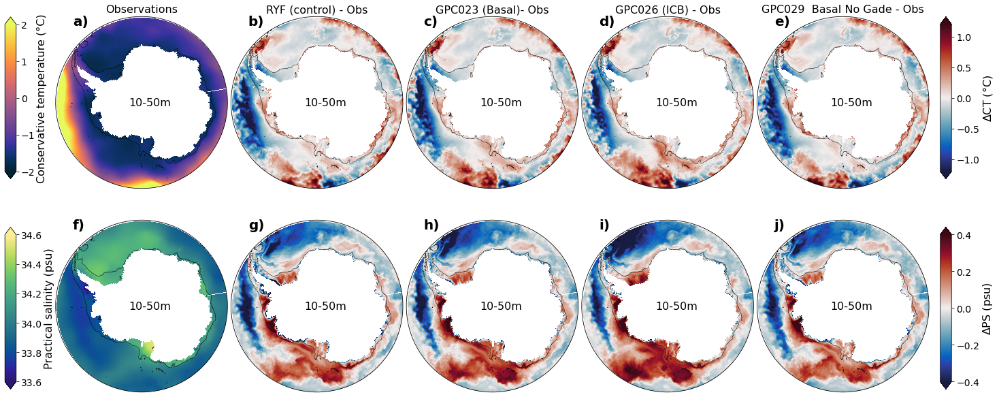

In [56]:
fig, axes = plot_obs(z_range,obs_temp,obs_salt)

plot_anom(axes[0][1], temp_cntl_anom, cmocean.balance, t_anom_max)
plot_anom(axes[1][1], salt_cntl_anom, cmocean.balance, s_anom_max)

plot_anom(axes[0][2], temp_basal_anom, cmocean.balance, t_anom_max)
plot_anom(axes[1][2], salt_basal_anom, cmocean.balance, s_anom_max)

plot_anom(axes[0][3], temp_icb_anom, cmocean.balance, t_anom_max)
plot_anom(axes[1][3], salt_icb_anom, cmocean.balance, s_anom_max)

cbT = plot_anom(axes[0][4], temp_basalnogade_anom, cmocean.balance, t_anom_max)
cbS = plot_anom(axes[1][4], salt_basalnogade_anom, cmocean.balance, s_anom_max)

plot_colorbar(fig,[0.91, 0.55, 0.010, 0.3],cbT,'$\Delta$CT (\u00b0C)')
plot_colorbar(fig,[0.91, 0.16, 0.010, 0.3],cbS,'$\Delta$PS (psu)')

plt.show()

300-350m. 

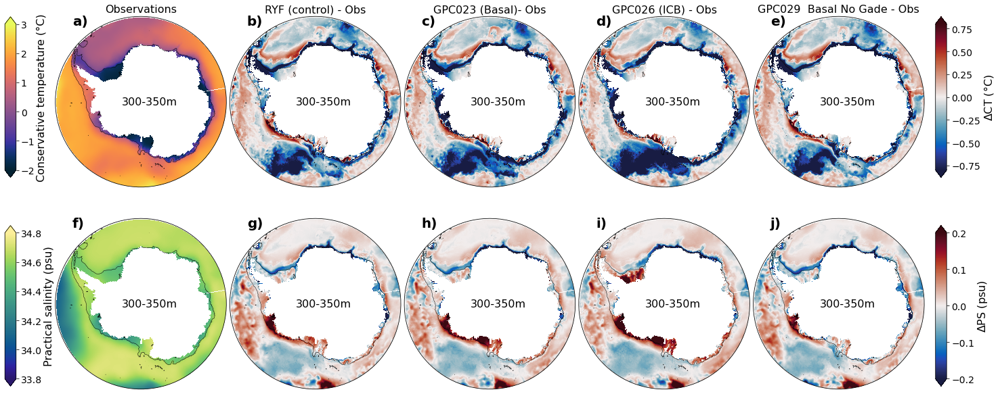

In [86]:
fig, axes = plot_obs(z_range,obs_temp,obs_salt)

plot_anom(axes[0][1], temp_cntl_anom, cmocean.balance, t_anom_max)
plot_anom(axes[1][1], salt_cntl_anom, cmocean.balance, s_anom_max)

plot_anom(axes[0][2], temp_basal_anom, cmocean.balance, t_anom_max)
plot_anom(axes[1][2], salt_basal_anom, cmocean.balance, s_anom_max)

plot_anom(axes[0][3], temp_icb_anom, cmocean.balance, t_anom_max)
plot_anom(axes[1][3], salt_icb_anom, cmocean.balance, s_anom_max)

cbT = plot_anom(axes[0][4], temp_basalnogade_anom, cmocean.balance, t_anom_max)
cbS = plot_anom(axes[1][4], salt_basalnogade_anom, cmocean.balance, s_anom_max)

plot_colorbar(fig,[0.91, 0.55, 0.010, 0.3],cbT,'$\Delta$CT (\u00b0C)')
plot_colorbar(fig,[0.91, 0.16, 0.010, 0.3],cbS,'$\Delta$PS (psu)')

plt.show()

#### Plot anomalies compared to control. 

In [84]:
def plot_cntl_anoms(z_range,cntl_temp,cntl_salt):

    zslice = slice(z_range[0], z_range[1])
    vminT, vmaxT = -2, 3
    vminS, vmaxS = 33.6, 34.8
    cmapT, cmapS, cmapA = cmocean.thermal, cmocean.haline, cmocean.balance

    plt.rcParams['font.size'] = 16
    fig,axes = plt.subplots(2,4,figsize=(22,11),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    plt.subplots_adjust(wspace=0.01, hspace=0.01)
    map_elements_cntl(axes)

    for i, ax in enumerate(axes.flatten()):
        ax.text(0.55, 0.5, f'{z_range[0]}-{z_range[1]}m', ha='center', va='center', transform = ax.transAxes)
    
    # plot control means
    cb_varT = axes[0,0].pcolormesh(cntl_temp.xt_ocean, cntl_temp.yt_ocean, cntl_temp,
                   cmap = cmapT, vmin=vminT, vmax=vmaxT, transform = ccrs.PlateCarree())
    cb_varS = axes[1,0].pcolormesh(cntl_salt.xt_ocean, cntl_salt.yt_ocean, cntl_salt,
               cmap = cmapS, vmin=vminS, vmax=vmaxS, transform = ccrs.PlateCarree())
    plot_colorbar(fig,[0.08, 0.55, 0.010, 0.3],cb_varT,'Conservative temperature (\u00b0C)')
    plot_colorbar(fig,[0.08, 0.16, 0.010, 0.3],cb_varS,'Practical salinity (psu)')
    
    return fig, axes

In [82]:
t_anom_max = 0.8
s_anom_max = 0.2

10-50m. 

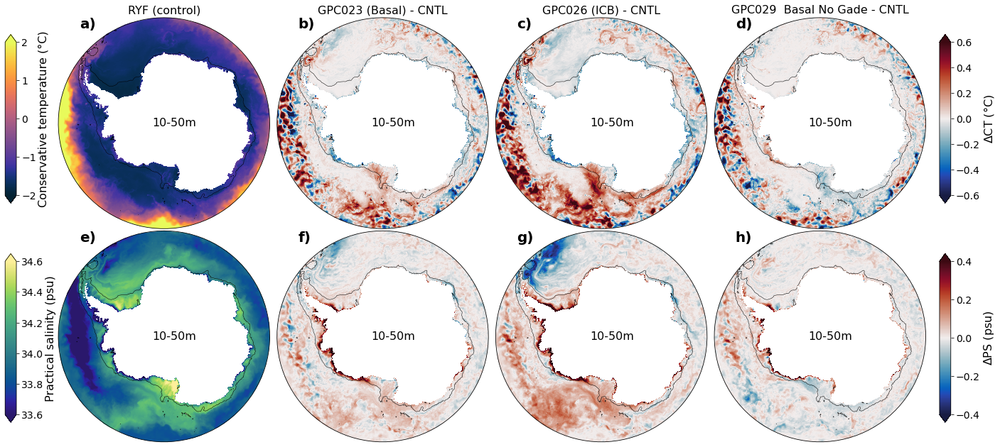

In [74]:
fig, axes = plot_cntl_anoms(z_range,temp_cntl_mean,salt_cntl_mean)

plot_anom(axes[0][1], temp_basal_mean-temp_cntl_mean, cmocean.balance, t_anom_max)
plot_anom(axes[1][1], salt_basal_mean-salt_cntl_mean, cmocean.balance, s_anom_max)

plot_anom(axes[0][2], temp_icb_mean-temp_cntl_mean, cmocean.balance, t_anom_max)
plot_anom(axes[1][2], salt_icb_mean-salt_cntl_mean, cmocean.balance, s_anom_max)

cbT = plot_anom(axes[0][3], temp_basalnogade_mean-temp_cntl_mean, cmocean.balance, t_anom_max)
cbS = plot_anom(axes[1][3], salt_basalnogade_mean-salt_cntl_mean, cmocean.balance, s_anom_max)

plot_colorbar(fig,[0.91, 0.55, 0.010, 0.3],cbT,'$\Delta$CT (\u00b0C)')
plot_colorbar(fig,[0.91, 0.16, 0.010, 0.3],cbS,'$\Delta$PS (psu)')

plt.show()

300-350m

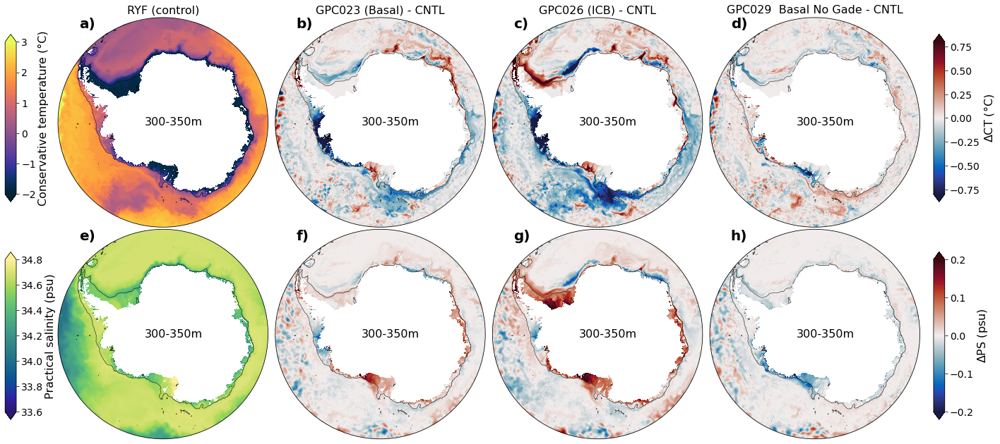

In [87]:
fig, axes = plot_cntl_anoms(z_range,temp_cntl_mean,salt_cntl_mean)

plot_anom(axes[0][1], temp_basal_mean-temp_cntl_mean, cmocean.balance, t_anom_max)
plot_anom(axes[1][1], salt_basal_mean-salt_cntl_mean, cmocean.balance, s_anom_max)

plot_anom(axes[0][2], temp_icb_mean-temp_cntl_mean, cmocean.balance, t_anom_max)
plot_anom(axes[1][2], salt_icb_mean-salt_cntl_mean, cmocean.balance, s_anom_max)

cbT = plot_anom(axes[0][3], temp_basalnogade_mean-temp_cntl_mean, cmocean.balance, t_anom_max)
cbS = plot_anom(axes[1][3], salt_basalnogade_mean-salt_cntl_mean, cmocean.balance, s_anom_max)

plot_colorbar(fig,[0.91, 0.55, 0.010, 0.3],cbT,'$\Delta$CT (\u00b0C)')
plot_colorbar(fig,[0.91, 0.16, 0.010, 0.3],cbS,'$\Delta$PS (psu)')

plt.show()

# Old figures

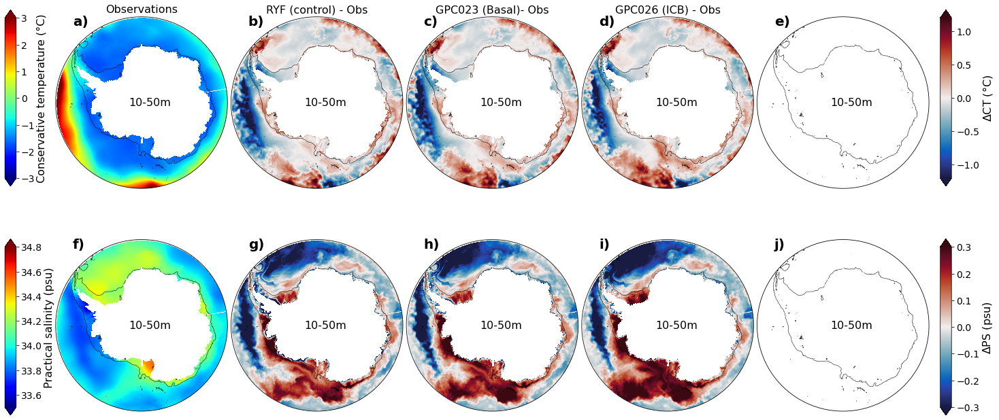

In [27]:
z_range=[z_min, z_max]

figure_ts_zrange(z_range,obs_temp,obs_salt,temp_cntl_anom,salt_cntl_anom,temp_basal_anom,salt_basal_anom,temp_icb_anom,salt_icb_anom)
plt.show()

In [47]:
%%time
z_range=[10,50] # maximum range of the Pauthenet et al. (2021) data is [10, 380]. 
zslice = slice(z_range[0],z_range[1])

# first calculate depth-averaged mean temperature and salnity
dzt_cntl_slice = dzt_cntl.sel(st_ocean=zslice)/dzt_cntl.sel(st_ocean=zslice).sum(dim='st_ocean')
dzt_gade_slice = dzt_gade.sel(st_ocean=zslice)/dzt_gade.sel(st_ocean=zslice).sum(dim='st_ocean')
dzt_gade_icb_slice = dzt_gade_icb.sel(st_ocean=zslice)/dzt_gade_icb.sel(st_ocean=zslice).sum(dim='st_ocean')

temp_cntl_mean = (temp_cntl.sel(st_ocean=zslice)*dzt_cntl_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_cntl_mean = (salt_cntl.sel(st_ocean=zslice)*dzt_cntl_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_gade_mean = (temp_gade.sel(st_ocean=zslice)*dzt_gade_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_gade_mean = (salt_gade.sel(st_ocean=zslice)*dzt_gade_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_gade_icb_mean = (temp_gade_icb.sel(st_ocean=zslice)*dzt_gade_icb_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_gade_icb_mean = (salt_gade_icb.sel(st_ocean=zslice)*dzt_gade_icb_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_cntl_mean = temp_cntl_mean.where( temp_cntl_mean != 0., np.nan)
salt_cntl_mean = salt_cntl_mean.where( salt_cntl_mean != 0., np.nan)

temp_gade_mean = temp_gade_mean.where( temp_gade_mean != 0., np.nan)
salt_gade_mean = salt_gade_mean.where( salt_gade_mean != 0., np.nan)

temp_gade_icb_mean = temp_gade_icb_mean.where( temp_gade_icb_mean != 0., np.nan)
salt_gade_icb_mean = salt_gade_icb_mean.where( salt_gade_icb_mean != 0., np.nan)

# now calculate anomalies
# do not need to weight observations since they are evenly spaced (vertically) every 2 m
temp_cntl_a = temp_cntl_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_cntl_a = salt_cntl_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T
temp_gade_a = temp_gade_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_gade_a = salt_gade_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T
temp_gade_icb_a = temp_gade_icb_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_gade_icb_a = salt_gade_icb_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T

CPU times: user 1min 17s, sys: 5.34 s, total: 1min 22s
Wall time: 2min 3s


Define figure functions and other plotting data. 

In [15]:
fontsize=16
subplot_titles = ['Observations',
                 'RYF (control) - Obs',
                 'GPC023 (Basal)- Obs',
                 'GPC026 (ICB) - Obs']
subplot_labels = ['a)','b)','c)','d)','e)','f)','g)','h)']

# topography data for plotting:
data_path = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091/'
htfile = data_path + 'output196/ocean/ocean_grid.nc'
ht = xr.open_dataset(htfile).ht.sel(yt_ocean=slice(-90,-55)).load()
land_mask = np.squeeze(ht.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = ht.yt_ocean.values
land_mask_lat[0] = -90

# define circle 
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)

def map_elements(axes):
    for i, ax in enumerate(axes.flatten()):
        ax.set_boundary(circle, transform=ax.transAxes)
        ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
        ax.set_extent([-280, 80, -90, -60], ccrs.PlateCarree())
        if i <= 3:
            ax.set_title(subplot_titles[i],fontsize=16)
        ax.text(0.1, 0.95, subplot_labels[i],fontsize=20, fontweight='bold',transform = ax.transAxes)
        
def plot_colorbar(fig,axes_loc,cb_item,label):
    cbaxes = fig.add_axes(axes_loc)
    cbar = plt.colorbar(cb_item, cax = cbaxes, orientation = 'vertical',extend = 'both', shrink=0.5)
    cbar.set_label(label,fontsize=fontsize,labelpad=3)
    cbar.ax.tick_params(labelsize=14)
    return cbar

def figure_ts_zrange(z_range,obs_temp,obs_salt,cntl_temp_a,cntl_salt_a,temp_gade_a,salt_gade_a,temp_gade_icb_a,salt_gade_icb_a):
    plt.rcParams['font.size'] = 16
    fig,axes = plt.subplots(2,4,figsize=(23,12),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    plt.subplots_adjust(wspace=0.02, hspace=0.01)
    map_elements(axes)
    vminT, vmaxT = -3, 3
    vminS, vmaxS = 33.5, 34.8
    #vminT, vmaxT = -2, 3
    #vminS, vmaxS = 34.0, 34.8
    #cmapT, cmapS, cmapA = cmocean.thermal, cmocean.haline, cmocean.balance
    cmapT, cmapS, cmapA = cmocean.cm.jet, cmocean.cm.jet, cmocean.balance
    vminTa, vmaxTa = -1.2, 1.2
    vminSa, vmaxSa = -0.3, 0.3
    for i, ax in enumerate(axes.flatten()):
        ax.text(0.55, 0.5, f'{z_range[0]}-{z_range[1]}m', ha='center', va='center', transform = ax.transAxes)
    # plot observations
    cb_varT = axes[0,0].pcolormesh(obs_temp.xt_ocean, obs_temp.yt_ocean, obs_temp.sel(depth=zslice).mean(dim='depth').T,
                   cmap = cmapT, vmin=vminT, vmax=vmaxT, 
                   transform = ccrs.PlateCarree())
    cb_varS = axes[1,0].pcolormesh(obs_salt.xt_ocean, obs_salt.yt_ocean, obs_salt.sel(depth=zslice).mean(dim='depth').T,
               cmap = cmapS, vmin=vminS, vmax=vmaxS, 
               transform = ccrs.PlateCarree())
    plot_colorbar(fig,[0.08, 0.55, 0.010, 0.3],cb_varT,'Conservative temperature (\u00b0C)')
    plot_colorbar(fig,[0.08, 0.16, 0.010, 0.3],cb_varS,'Practical salinity (psu)')
    # plot control anomalies
    cb_anomT = axes[0,1].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, cntl_temp_a,
                   cmap = cmapA, vmin=vminTa, vmax=vmaxTa, 
                   transform = ccrs.PlateCarree())
    cb_anomS = axes[1,1].pcolormesh(cntl_salt_a.xt_ocean, cntl_salt_a.yt_ocean, cntl_salt_a,
                   cmap = cmapA, vmin=vminSa, vmax=vmaxSa, 
                   transform = ccrs.PlateCarree())
    # plot perturbation anomalies
    axes[0,2].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, temp_gade_a,
                   cmap = cmapA, vmin=vminTa, vmax=vmaxTa, 
                   transform = ccrs.PlateCarree())
    axes[1,2].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, salt_gade_a,
                   cmap = cmapA, vmin=vminSa, vmax=vmaxSa, 
                   transform = ccrs.PlateCarree())
    # plot perturbation - control anomalies
    axes[0,3].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, temp_gade_icb_a,
                   cmap = cmapA, vmin=vminTa, vmax=vmaxTa, 
                   transform = ccrs.PlateCarree())
    axes[1,3].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, salt_gade_icb_a,
                   cmap = cmapA, vmin=vminSa, vmax=vmaxSa, 
                   transform = ccrs.PlateCarree())
    plot_colorbar(fig,[0.91, 0.55, 0.010, 0.3],cb_anomT,'$\Delta$CT (\u00b0C)')
    plot_colorbar(fig,[0.91, 0.16, 0.010, 0.3],cb_anomS,'$\Delta$PS (psu)')
    return fig, axes

Plot figure with climatology and differences from ACCESS-OM2-01 control and perturbation. 

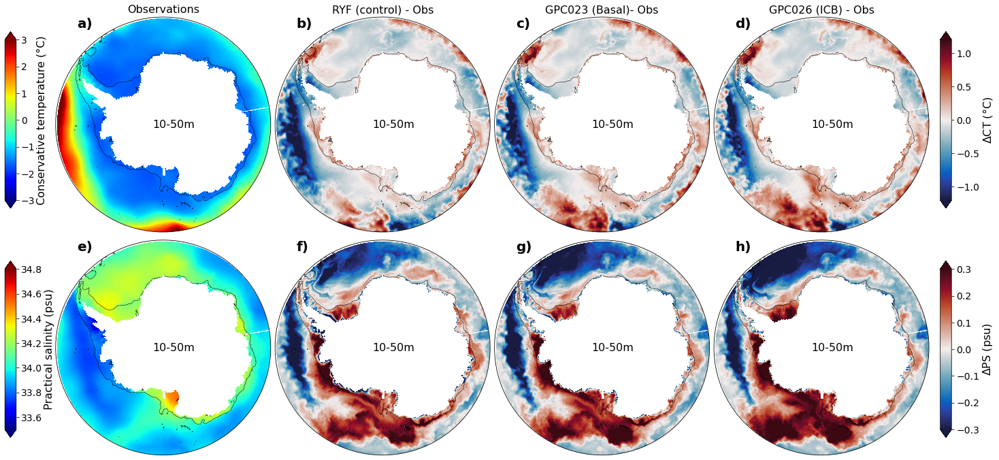

In [49]:
figure_ts_zrange(z_range, obs_temp, obs_salt, temp_cntl_a, salt_cntl_a,temp_gade_a,salt_gade_a,temp_gade_icb_a,salt_gade_icb_a)

plt.show()

In [50]:
#Now for 300m

In [51]:
%%time
z_range=[300,350] # maximum range of the Pauthenet et al. (2021) data. 
zslice = slice(z_range[0],z_range[1])

# first calculate depth-averaged mean temperature and salnity
dzt_cntl_slice = dzt_cntl.sel(st_ocean=zslice)/dzt_cntl.sel(st_ocean=zslice).sum(dim='st_ocean')
dzt_gade_slice = dzt_gade.sel(st_ocean=zslice)/dzt_gade.sel(st_ocean=zslice).sum(dim='st_ocean')
dzt_gade_icb_slice = dzt_gade_icb.sel(st_ocean=zslice)/dzt_gade_icb.sel(st_ocean=zslice).sum(dim='st_ocean')

temp_cntl_mean = (temp_cntl.sel(st_ocean=zslice)*dzt_cntl_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_cntl_mean = (salt_cntl.sel(st_ocean=zslice)*dzt_cntl_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_gade_mean = (temp_gade.sel(st_ocean=zslice)*dzt_gade_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_gade_mean = (salt_gade.sel(st_ocean=zslice)*dzt_gade_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_gade_icb_mean = (temp_gade_icb.sel(st_ocean=zslice)*dzt_gade_icb_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_gade_icb_mean = (salt_gade_icb.sel(st_ocean=zslice)*dzt_gade_icb_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_cntl_mean = temp_cntl_mean.where( temp_cntl_mean != 0., np.nan)
salt_cntl_mean = salt_cntl_mean.where( salt_cntl_mean != 0., np.nan)

temp_gade_mean = temp_gade_mean.where( temp_gade_mean != 0., np.nan)
salt_gade_mean = salt_gade_mean.where( salt_gade_mean != 0., np.nan)

temp_gade_icb_mean = temp_gade_icb_mean.where( temp_gade_icb_mean != 0., np.nan)
salt_gade_icb_mean = salt_gade_icb_mean.where( salt_gade_icb_mean != 0., np.nan)

# now calculate anomalies
# do not need to weight observations since they are evenly spaced (vertically) every 2 m
temp_cntl_a = temp_cntl_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_cntl_a = salt_cntl_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T
temp_gade_a = temp_gade_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_gade_a = salt_gade_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T
temp_gade_icb_a = temp_gade_icb_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_gade_icb_a = salt_gade_icb_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T

CPU times: user 1min 5s, sys: 4.4 s, total: 1min 9s
Wall time: 1min 36s


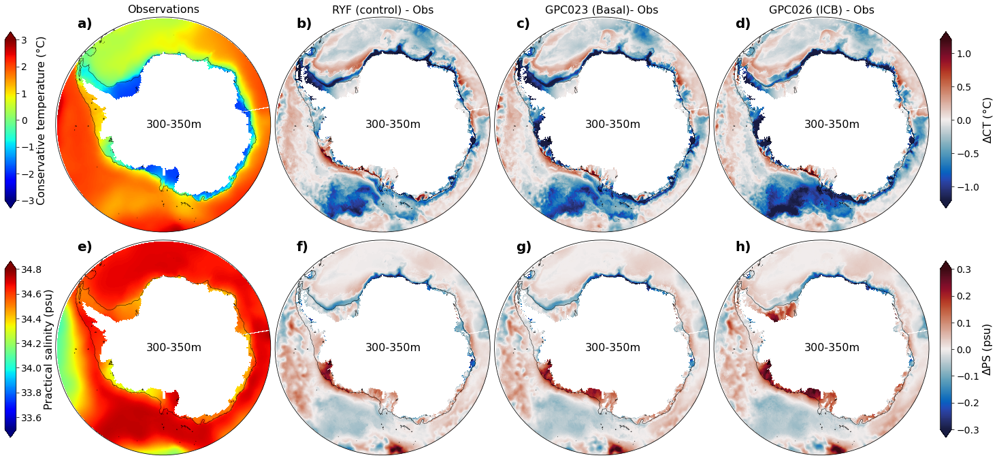

In [52]:
figure_ts_zrange(z_range, obs_temp, obs_salt, temp_cntl_a, salt_cntl_a,temp_gade_a,salt_gade_a,temp_gade_icb_a,salt_gade_icb_a)

plt.show()

## Original code. 

In [9]:
# build database for these experiments:
observations = 'TS_data'
session_data = '/g/data/e14/pc5520/model_data/access-om2/basal_melt_MOM5/TS_data.db'
obs_session = cc.database.create_session(session_data)
dir_TSobs = ['/g/data/e14/pc5520/TS_data/']
cc.database.build_index(dir_TSobs,obs_session)

Indexing experiment: TS_data


0

In [10]:
#Import obs
salt_obs = cc.querying.getvar(observations, 'Sal', obs_session, ncfile='TS_Climato_Antarctic60S.nc')
temp_obs = cc.querying.getvar(observations, 'Temp', obs_session, ncfile='TS_Climato_Antarctic60S.nc')

In [11]:
# topography data for plotting:
ht = cc.querying.getvar(control,'ht' , master_session,n=1).sel(yt_ocean=lat_slice)
land_mask = np.squeeze(ht.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = ht.yt_ocean.values
land_mask_lat[0] = -90

In [12]:
Tfreezing_min_calv_2 = Tfreezing_min_calv_2_gade

In [13]:
salt_con = cc.querying.getvar(control, 'salt', master_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
salt_con = salt_con.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

salt_Tfreezing_min_calv_2 = cc.querying.getvar(Tfreezing_min_calv_2, 'salt', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
salt_Tfreezing_min_calv_2 = salt_Tfreezing_min_calv_2.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

In [14]:
temp_con = cc.querying.getvar(control, 'temp', master_session, frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
temp_con = temp_con.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

temp_Tfreezing_min_calv_2 = cc.querying.getvar(Tfreezing_min_calv_2, 'temp', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
temp_Tfreezing_min_calv_2 = temp_Tfreezing_min_calv_2.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

In [15]:
def plot_obs(zz=None,tt=None,var_simu=None,var_obs=None,var_con=None,vmin=33,vmax=35):

    fontsize=16

    fig=plt.figure(figsize=(20,16))
    
    #Find kk
    st_ocean = var_simu.st_ocean.values
    kk_sim = np.argmin(abs(st_ocean-zz))
    
    depth = var_obs.depth.values
    kk_obs = np.argmin(abs(depth-zz))
    
    norm = col.Normalize(vmin=vmin,vmax=vmax)

    #Obs temp
    
    xx, yy = np.meshgrid(var_obs.lon,var_obs.lat)

    ax = fig.add_axes([0.0, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    ## plot:
    cf = ax.pcolormesh(xx, yy, var_obs[:,:,tt,kk_obs].transpose(), norm=norm,
                   cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Observations',fontsize=fontsize)
    #ax.contourf(ht.xt_ocean, land_mask_lat,land_mask_masked,colors='darkgrey',
    #             zorder=2,transform = ccrs.PlateCarree())
    ax.set_extent([-180, 180, -90, -59.5], ccrs.PlateCarree())
    
        #### Control:
    ax = fig.add_axes([0.3, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_con.xt_ocean,var_con.yt_ocean,var_con[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Control',fontsize=fontsize)
    
    #### Tfreezing_min:
    ax = fig.add_axes([0.6, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_simu.xt_ocean,var_simu.yt_ocean,var_simu[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Tfreezing',fontsize=fontsize)
    
    # colorbar:
    cbaxes = fig.add_axes([0.93, 0.25, 0.012, 0.5])
    cbar = plt.colorbar(pcm, cax = cbaxes, orientation = 'vertical',extend = 'both')
    #cbar.set_label(r'Temperature obs',fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=fontsize)

In [16]:
def plot_obs_diff(zz=None,tt=None,var_simu=None,var_obs=None,var_con=None,vmin=33,vmax=35, scale_max=0.15):

    fontsize=16

    fig=plt.figure(figsize=(20,16))
    
    #Find kk
    st_ocean = var_simu.st_ocean.values
    kk_sim = np.argmin(abs(st_ocean-zz))
    
    depth = var_obs.depth.values
    kk_obs = np.argmin(abs(depth-zz))
    
    norm = col.Normalize(vmin=vmin,vmax=vmax)

    #Obs temp
    
    xx, yy = np.meshgrid(var_obs.lon,var_obs.lat)

    ax = fig.add_axes([0.0, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    ## plot:
    cf = ax.pcolormesh(xx, yy, var_obs[:,:,tt,kk_obs].transpose(), norm=norm,
                   cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Observations',fontsize=fontsize)
    #ax.contourf(ht.xt_ocean, land_mask_lat,land_mask_masked,colors='darkgrey',
    #             zorder=2,transform = ccrs.PlateCarree())
    ax.set_extent([-180, 180, -90, -59.5], ccrs.PlateCarree())
    
        #### Control:
    ax = fig.add_axes([0.3, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_con.xt_ocean,var_con.yt_ocean,var_con[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Control',fontsize=fontsize)
    
    #### Tfreezing_min:
    norm2 = col.Normalize(vmin=-scale_max,vmax=scale_max)
    
    ax = fig.add_axes([0.6, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_simu.xt_ocean,var_simu.yt_ocean,var_simu[tt,kk_sim,:,:] - var_con[tt,kk_sim,:,:],norm=norm2,
                       cmap = cmocean.balance, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Tfreezing',fontsize=fontsize)
    
    # colorbar:
    cbaxes = fig.add_axes([0.93, 0.25, 0.012, 0.5])
    cbar = plt.colorbar(pcm, cax = cbaxes, orientation = 'vertical',extend = 'both')
    #cbar.set_label(r'Temperature obs',fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=fontsize)

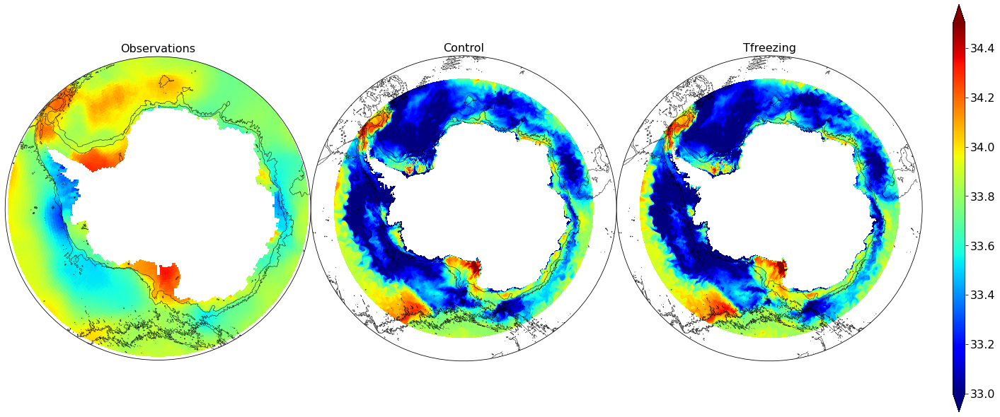

In [53]:
plot_obs(zz=10,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5)

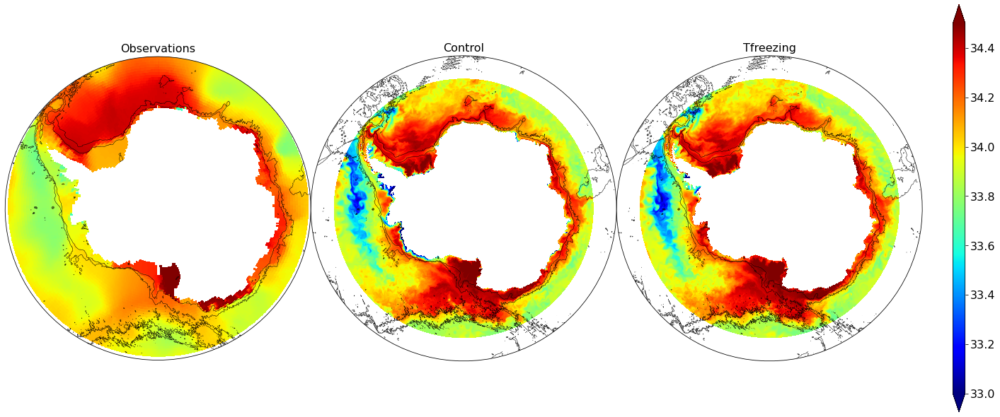

In [54]:
plot_obs(zz=10,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5)

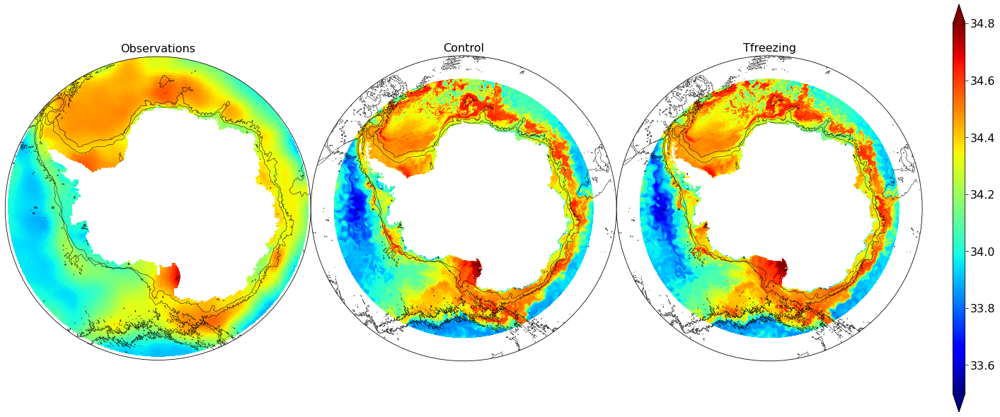

In [55]:
plot_obs(zz=100,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8)

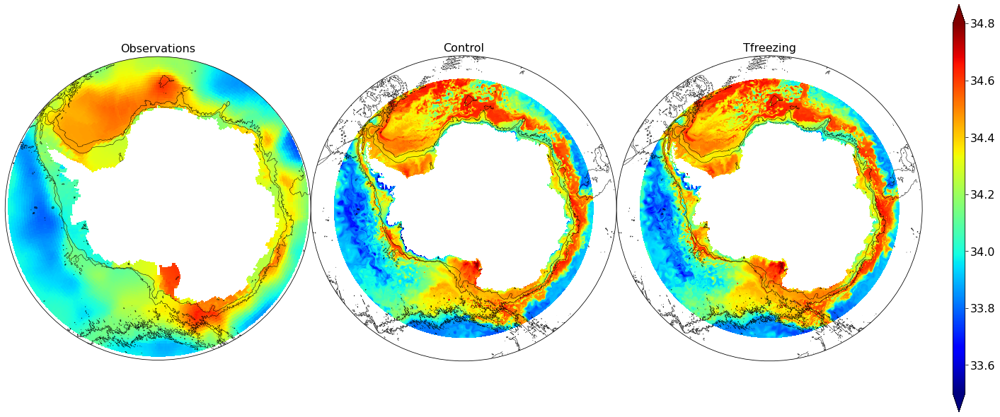

In [56]:
plot_obs(zz=100,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8)

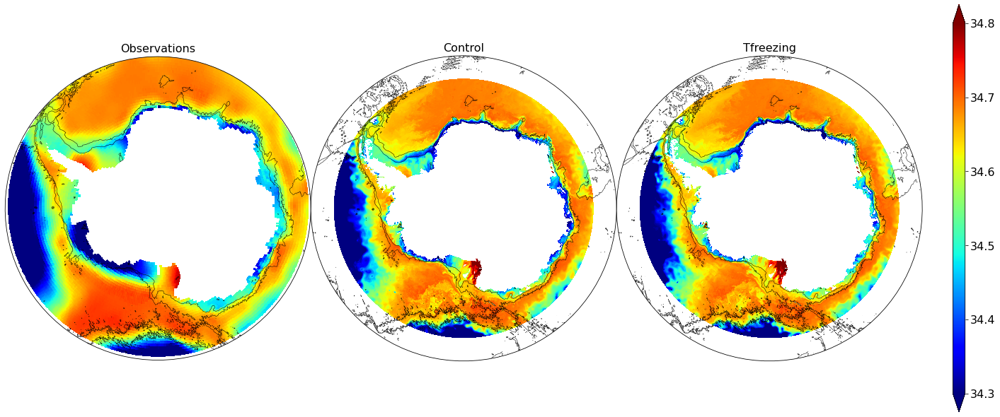

In [57]:
plot_obs(zz=300,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

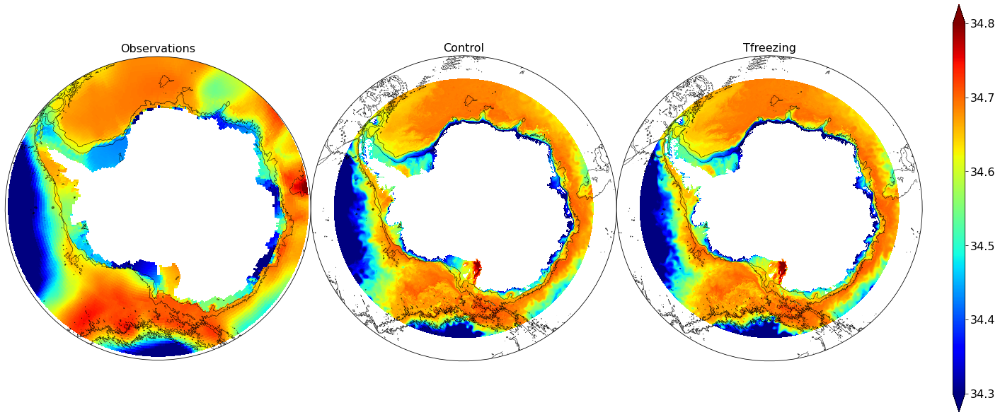

In [58]:
plot_obs(zz=300,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

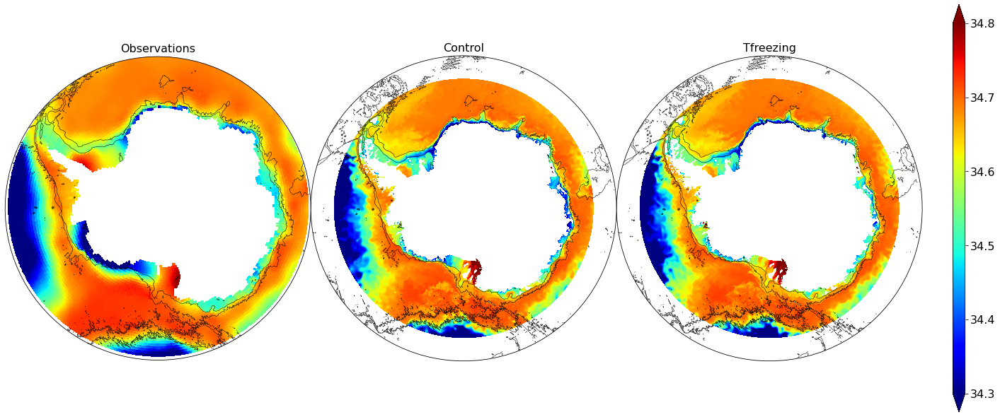

In [59]:
plot_obs(zz=380,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

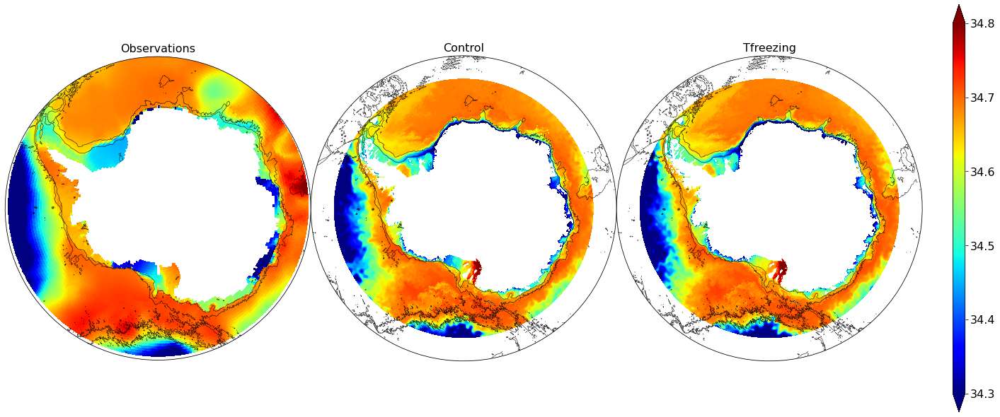

In [60]:
plot_obs(zz=380,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

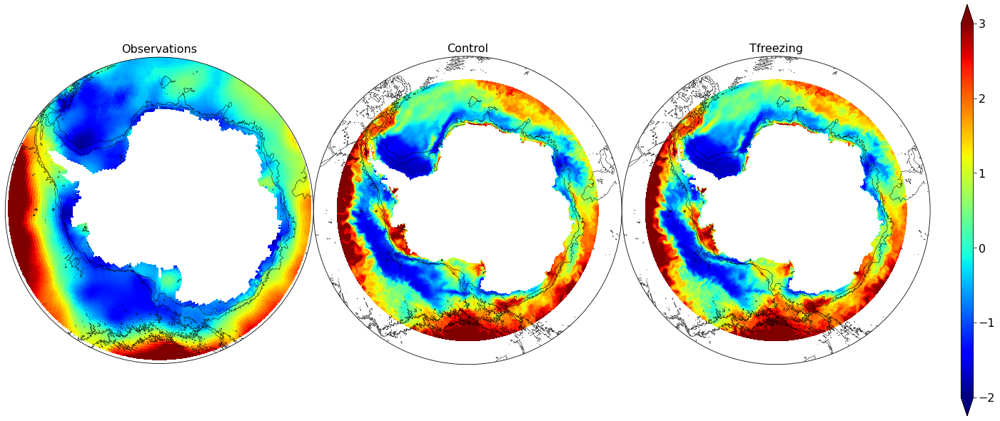

In [61]:
plot_obs(zz=10,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-2,vmax=3)

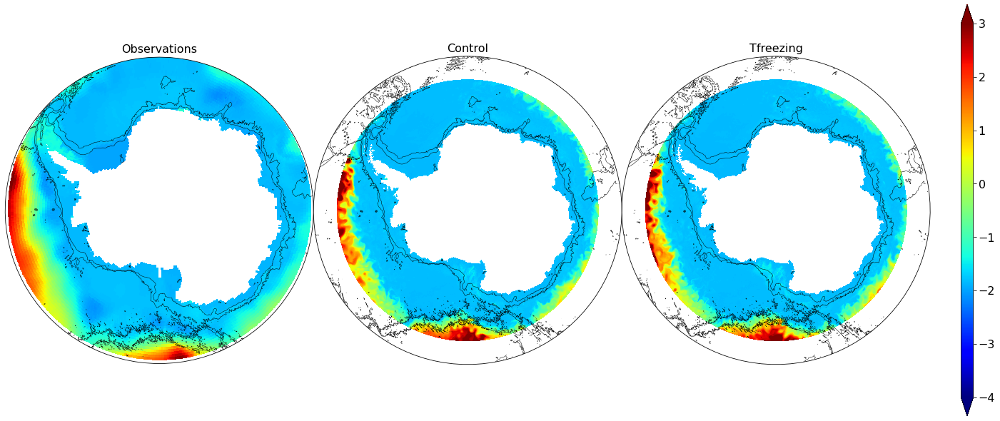

In [62]:
plot_obs(zz=10,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-4,vmax=3)

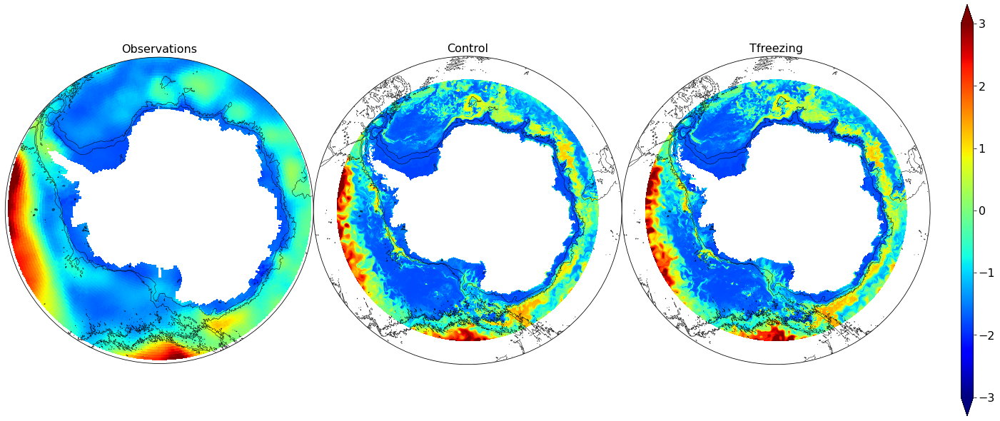

In [63]:
plot_obs(zz=100,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

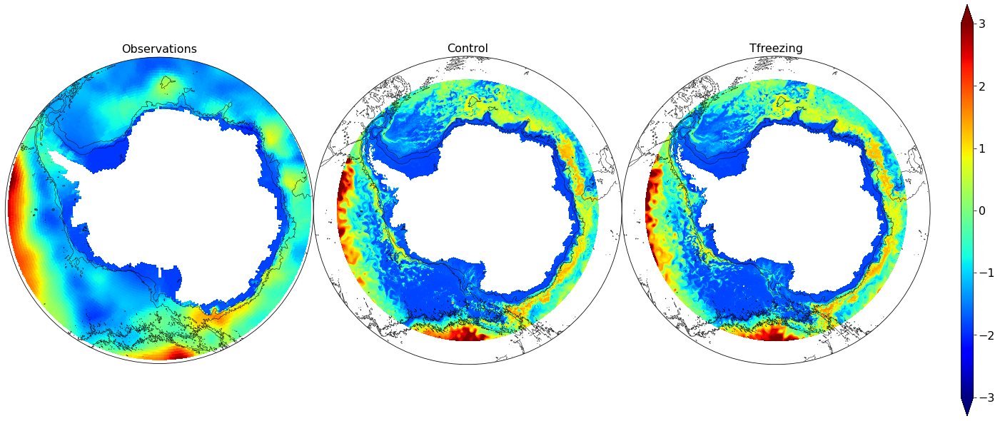

In [64]:
plot_obs(zz=100,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

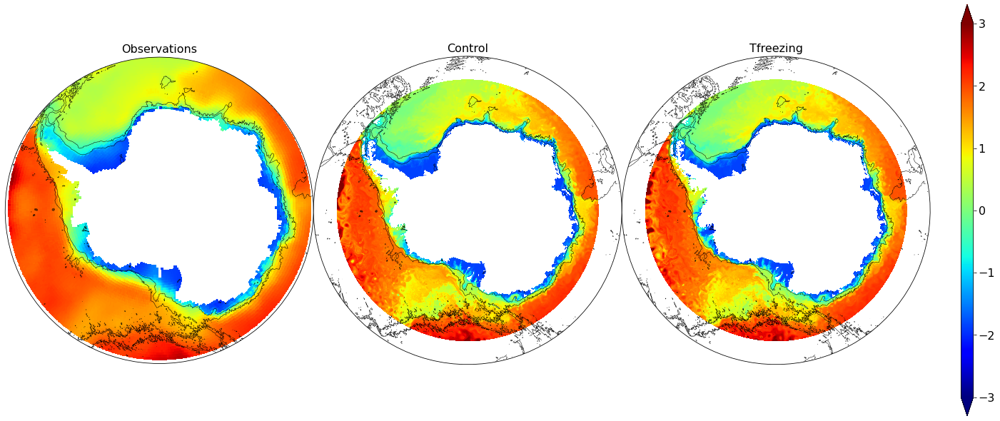

In [65]:
plot_obs(zz=300,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

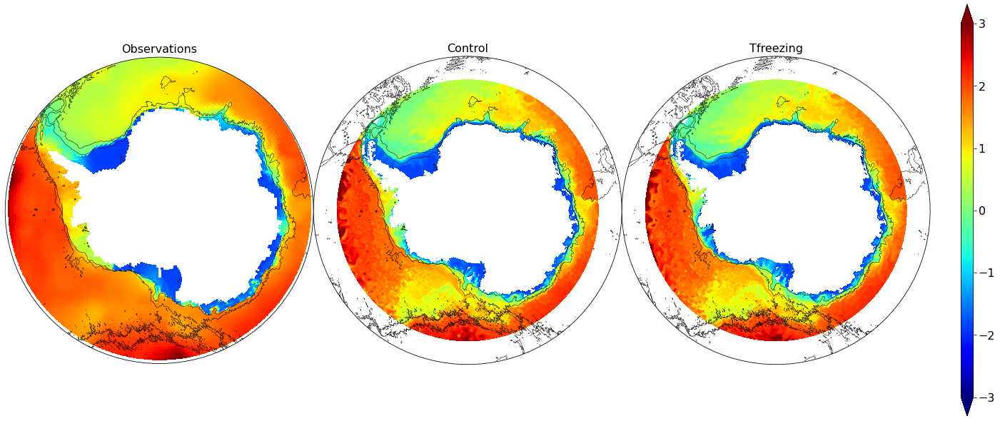

In [66]:
plot_obs(zz=300,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

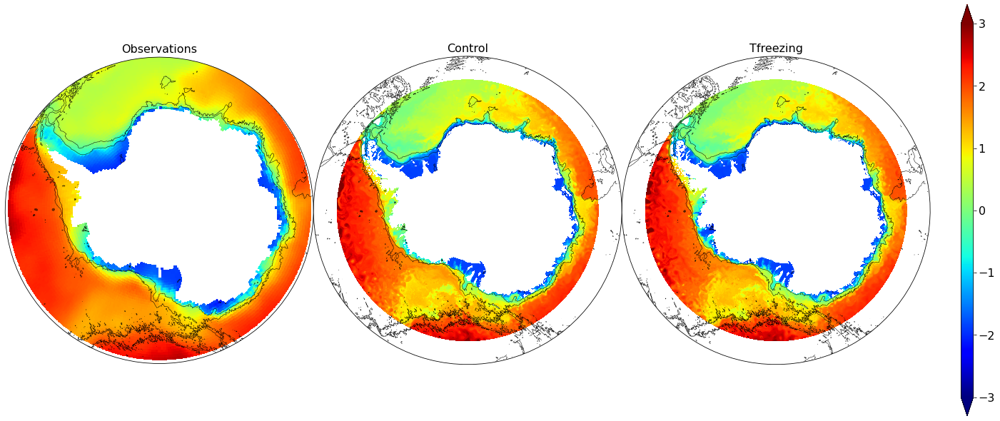

In [67]:
plot_obs(zz=380,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

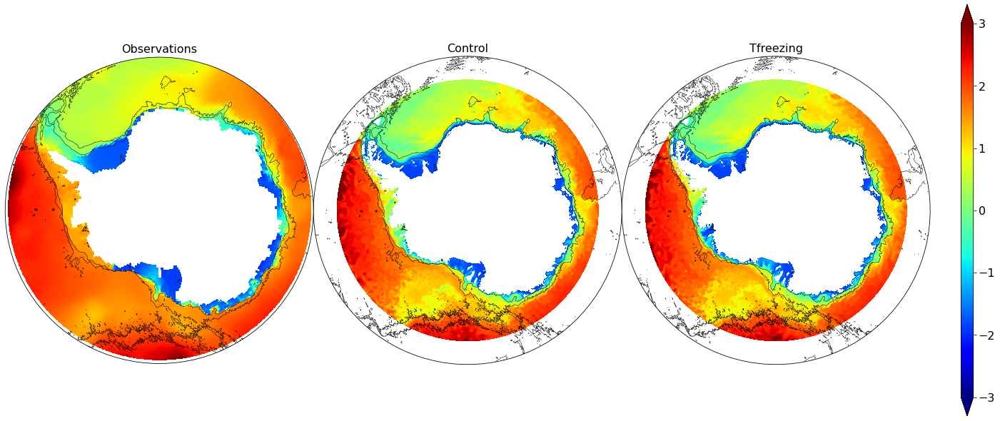

In [68]:
plot_obs(zz=380,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

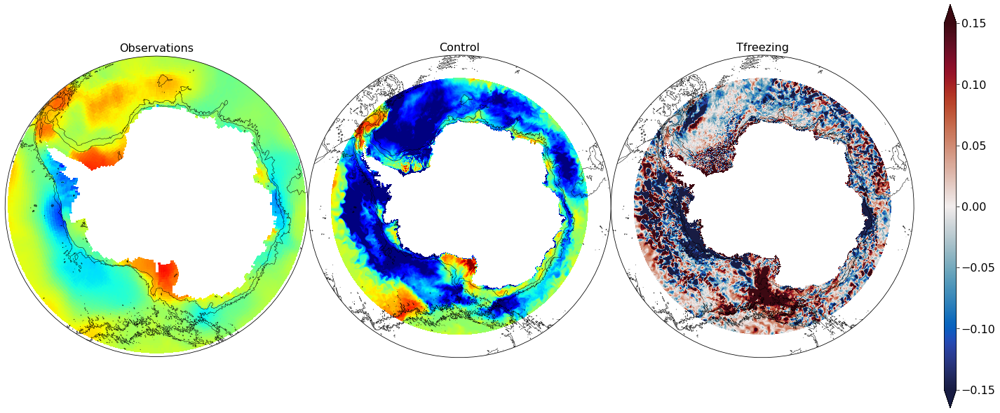

In [69]:
plot_obs_diff(zz=10,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5,scale_max=0.15)

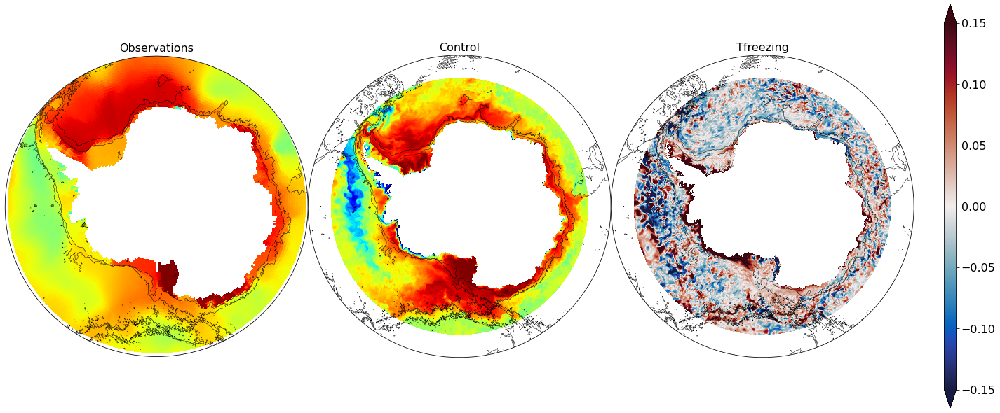

In [70]:
plot_obs_diff(zz=10,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5,scale_max=0.15)

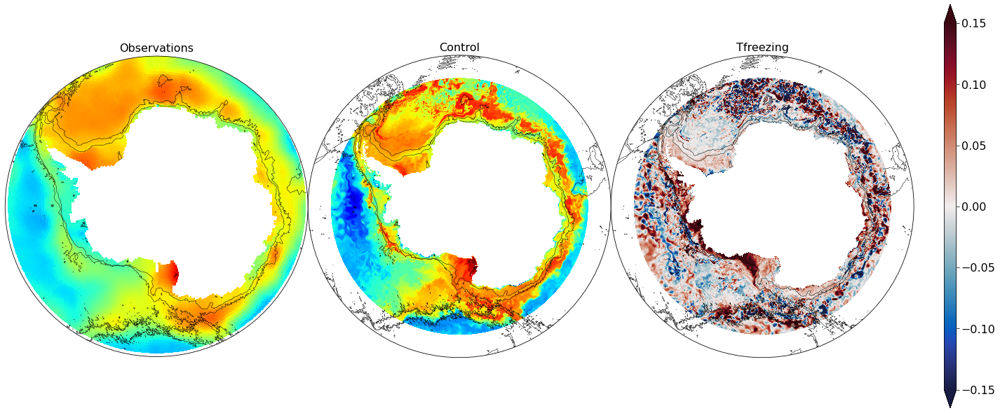

In [71]:
plot_obs_diff(zz=100,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8,scale_max=0.15)

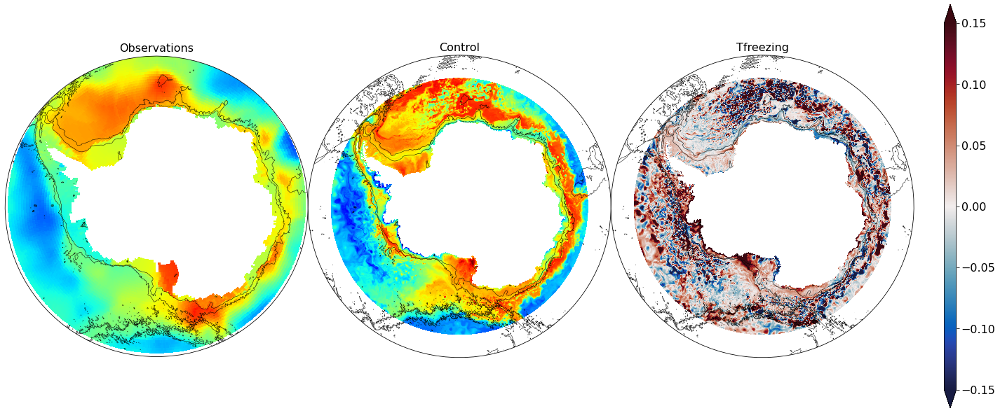

In [72]:
plot_obs_diff(zz=100,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8,scale_max=0.15)

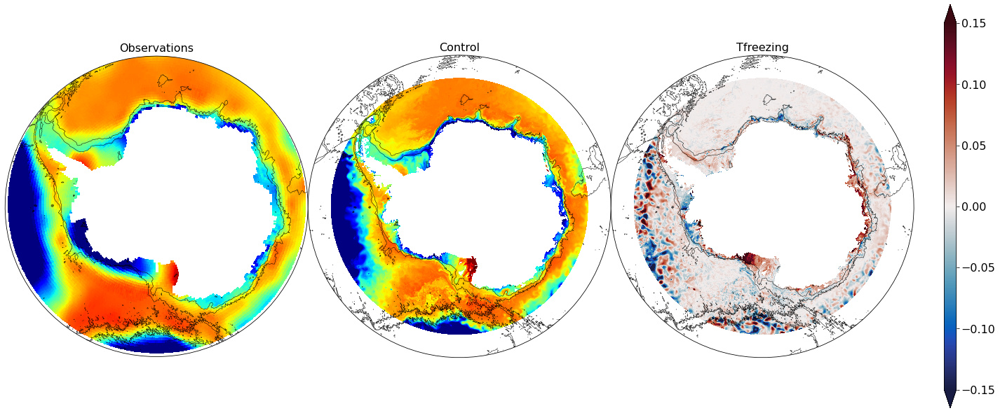

In [73]:
plot_obs_diff(zz=300,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8,scale_max=0.15)

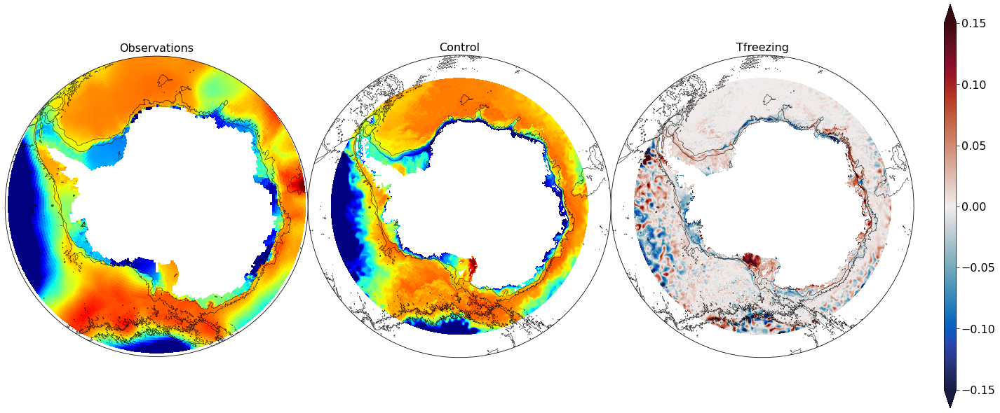

In [74]:
plot_obs_diff(zz=300,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8,scale_max=0.15)

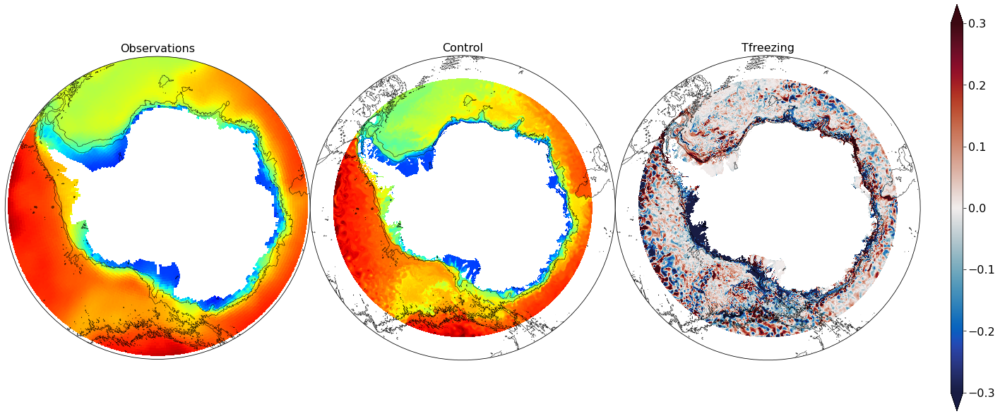

In [75]:
plot_obs_diff(zz=380,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3,scale_max=0.3)

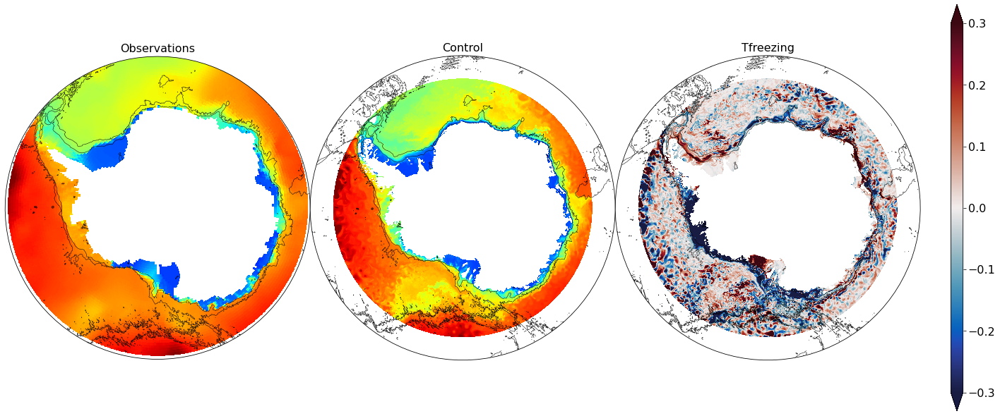

In [76]:
plot_obs_diff(zz=380,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3,scale_max=0.3)